In [64]:
%run features_.ipynb
import re
import numpy as np
import pandas as pd
import mne
from scipy import stats
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import time
import multiprocessing as mp
from joblib import Parallel, delayed
from pandarallel import pandarallel
from entropy import *
from itertools import combinations, permutations
from sklearn import preprocessing
from sklearn.model_selection import cross_val_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import csv
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from mne_features.feature_extraction import extract_features
from mne_features import *

%matplotlib inline

# Parameter

In [12]:
tr_path = "C:/Users/vita7/OneDrive/Documents/Github/EEG_SleepStage_Analysis/data/SC/training_nms/"
te_path = "C:/Users/vita7/OneDrive/Documents/Github/EEG_SleepStage_Analysis/data/SC/testing/"

record_regu = r"SC\d*\D\d\-PSG.edf"
annot_regu = r"SC\d*\D\D\-Hypnogram.edf"

channel_types = {
    'EEG Fpz-Cz': 'eeg',
    'EEG Pz-Oz': 'misc',
    'EOG horizontal': 'misc',
    'Resp oro-nasal': 'misc',
    'EMG submental': 'misc',
    'Temp rectal': 'misc',
    'Event marker': 'misc'
}

sleep_stage = {
    'Sleep stage W': 1,
    'Sleep stage 1': 2,
    'Sleep stage 2': 3,
    'Sleep stage 3': 4,
    'Sleep stage 4': 4,
    'Sleep stage R': 5
}

event_id = {
    'Sleep stage W': 1,
    'Sleep stage 1': 2,
    'Sleep stage 2': 3,
    'Sleep stage 3/4': 4,
    'Sleep stage R': 5,
}

funcs_n = [
    'Mean_frequency','Hjorth_mobility', 'Power', 'STD', 'SpectEn', 'PermEn', 'SVD_En', 'SampEn',
    'AutoCorr', 'Thr75'
]
ratio_n = [
    'EEG Fpz-Cz DOR', 'EEG Fpz-Cz TOR', 'EEG Fpz-Cz AOR', 'EEG Fpz-Cz SOR',
    'EEG Fpz-Cz BOR', 'EEG Fpz-Cz TDR', 'EEG Fpz-Cz ADR', 'EEG Fpz-Cz SDR',
    'EEG Fpz-Cz BDR', 'EEG Fpz-Cz ATR', 'EEG Fpz-Cz STR', 'EEG Fpz-Cz BTR',
    'EEG Fpz-Cz SAR', 'EEG Fpz-Cz BAR', 'EEG Fpz-Cz BSR'
]
six_bands_n = [
    'EEG Fpz-Cz', 'EEG Fpz-Cz Delta', 'EEG Fpz-Cz Theta', 'EEG Fpz-Cz Alpha',
    'EEG Fpz-Cz Sigma', 'EEG Fpz-Cz Beta'
]
frbands_n = six_bands_n + ratio_n

ep_duration = 10.
sfreq = 100.
chs = 1
funcs = 10
frb = 16
partial_bands_func_idx = 9
partial_bands = [[1]]

# DataTransfer

### Record name

In [13]:
record_name = []
annot_name = []

events = []  # events
for file_name in os.listdir(tr_path):
    match1 = re.search(record_regu, file_name)
    match2 = re.search(annot_regu, file_name)
    if (match1):
        record_name.append(match1.group())
    elif (match2):
        annot_name.append(match2.group())

if (len(record_name) != len(annot_name)):
    record_name = []
    annot_name = []

df = pd.concat([pd.DataFrame(record_name), pd.DataFrame(annot_name)], axis=1)
df.columns = ['Records', 'Hypnogram']
df

,Records,Hypnogram
0,SC4001E0-PSG.edf,SC4001EC-Hypnogram.edf
1,SC4051E0-PSG.edf,SC4051EC-Hypnogram.edf
2,SC4151E0-PSG.edf,SC4151EC-Hypnogram.edf
3,SC4182E0-PSG.edf,SC4182EC-Hypnogram.edf
4,SC4312E0-PSG.edf,SC4312EM-Hypnogram.edf
5,SC4451F0-PSG.edf,SC4451FY-Hypnogram.edf
6,SC4592G0-PSG.edf,SC4592GY-Hypnogram.edf
7,SC4812G0-PSG.edf,SC4812GV-Hypnogram.edf


### Read data

In [14]:
raw_ = []  # raw
events_ = []  # events

for ren, an in zip(record_name, annot_name):
    print('\n\033[5;31;47m File name:\n %s\033[0m\n' % (ren))
    rec = mne.io.read_raw_edf(tr_path + ren, preload=True)
    ann = mne.read_annotations(tr_path + an)

    # set annotations
    rec.set_annotations(ann, emit_warning=True)
    rec.set_channel_types(channel_types)
    rec.filter(0.5, 30, picks=['eeg'])
    ev, _ = mne.events_from_annotations(rec,
                                        use_rounding=False,
                                        event_id=sleep_stage,
                                        chunk_duration=ep_duration)

    events_.append(ev)
    raw_.append(rec)


 File name:
 SC4001E0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4001E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 7949999  =      0.000 ... 79499.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.610 sec)



<ipython-input-14-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4051E0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4051E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8165999  =      0.000 ... 81659.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.61

<ipython-input-14-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4151E0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4151E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 7859999  =      0.000 ... 78599.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.61

<ipython-input-14-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4182E0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4182E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8525999  =      0.000 ... 85259.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.61

<ipython-input-14-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4312E0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4312E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8099999  =      0.000 ... 80999.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.61

<ipython-input-14-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4451F0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4451F0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8369999  =      0.000 ... 83699.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.61

<ipython-input-14-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4592G0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4592G0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 6119999  =      0.000 ... 61199.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.61

<ipython-input-14-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']

 File name:
 SC4812G0-PSG.edf

Extracting EDF parameters from C:\Users\vita7\OneDrive\Documents\Github\EEG_SleepStage_Analysis\data\SC\training_nms\SC4812G0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 7247999  =      0.000 ... 72479.990 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 661 samples (6.61

<ipython-input-14-4c5fbb1b6727>:10: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  rec.set_annotations(ann, emit_warning=True)


Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']


### EP records

In [15]:
epochs_ = []
tmax = ep_duration - 1 / rec.info['sfreq']
for raw, eve in zip(raw_, events_):
    ep = mne.Epochs(
        raw=raw,
        picks=['eeg'],
        events=eve,
        event_id=event_id,
        tmin=0.,
        tmax=tmax,
        baseline=None,  # 1 epoch data - mean ( 1 epoch data)
        detrend=None,  # linear detrend
    )
    epochs_.append(ep)

7950 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
8166 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
7848 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
8526 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
8100 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
8370 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
6120 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
7242 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated


### EP Dataframe

In [16]:
ep_df_ = []
for eps in epochs_:
    df = eps.to_data_frame()

    # data balance
    con_len = list(
        df.groupby(level=['condition']).count()['EEG Fpz-Cz'] /
        (ep_duration * sfreq))  # epochs
    drop_len = np.floor(con_len[-1] - np.mean(con_len[:4]))  # epochs
    df = df[int(np.floor(drop_len / 2) *
                (ep_duration * sfreq)):int((np.sum(con_len) -
                                            np.floor(drop_len / 2)) *
                                           (ep_duration * sfreq))]

    # 5 frequency bands
    df['EEG Fpz-Cz Delta'] = mne.filter.filter_data(df['EEG Fpz-Cz'],
                                                    sfreq=100,
                                                    l_freq=0.5,
                                                    h_freq=4.5)
    df['EEG Fpz-Cz Theta'] = mne.filter.filter_data(df['EEG Fpz-Cz'],
                                                    sfreq=100,
                                                    l_freq=4.5,
                                                    h_freq=8.5)
    df['EEG Fpz-Cz Alpha'] = mne.filter.filter_data(df['EEG Fpz-Cz'],
                                                    sfreq=100,
                                                    l_freq=8.5,
                                                    h_freq=11.5)
    df['EEG Fpz-Cz Sigma'] = mne.filter.filter_data(df['EEG Fpz-Cz'],
                                                    sfreq=100,
                                                    l_freq=11.5,
                                                    h_freq=15.5)
    df['EEG Fpz-Cz Beta'] = mne.filter.filter_data(df['EEG Fpz-Cz'],
                                                   sfreq=100,
                                                   l_freq=15.5,
                                                   h_freq=30)

    ep_df_.append(df)

Loading data for 7950 events and 1000 original time points ...
0 bad epochs dropped
Converting "time" to "<class 'numpy.int64'>"...
Setting up band-pass filter from 0.5 - 4.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 4.50 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.50 Hz)
- Filter length: 661 samples (6.610 sec)

Setting up band-pass filter from 4.5 - 8.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.50
- Lower transition bandwidth: 2.00 Hz (-6 dB 


Loading data for 8526 events and 1000 original time points ...
0 bad epochs dropped
Converting "time" to "<class 'numpy.int64'>"...
Setting up band-pass filter from 0.5 - 4.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 4.50 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.50 Hz)
- Filter length: 661 samples (6.610 sec)

Setting up band-pass filter from 4.5 - 8.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.50
- Lower transition bandwidth: 2.00 Hz (-6 dB


Loading data for 6120 events and 1000 original time points ...
0 bad epochs dropped
Converting "time" to "<class 'numpy.int64'>"...
Setting up band-pass filter from 0.5 - 4.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 4.50 Hz
- Upper transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 5.50 Hz)
- Filter length: 661 samples (6.610 sec)

Setting up band-pass filter from 4.5 - 8.5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 4.50
- Lower transition bandwidth: 2.00 Hz (-6 dB

# Information

In [17]:
for df in ep_df_:
    print(df.info())

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 2450000 entries, (Sleep stage W, 2750, 0) to (Sleep stage W, 5199, 9990)
Data columns (total 6 columns):
EEG Fpz-Cz          float64
EEG Fpz-Cz Delta    float64
EEG Fpz-Cz Theta    float64
EEG Fpz-Cz Alpha    float64
EEG Fpz-Cz Sigma    float64
EEG Fpz-Cz Beta     float64
dtypes: float64(6)
memory usage: 123.9+ MB
None
<class 'pandas.core.frame.DataFrame'>
MultiIndex: 1740000 entries, (Sleep stage W, 3213, 0) to (Sleep stage 3/4, 4952, 9990)
Data columns (total 6 columns):
EEG Fpz-Cz          float64
EEG Fpz-Cz Delta    float64
EEG Fpz-Cz Theta    float64
EEG Fpz-Cz Alpha    float64
EEG Fpz-Cz Sigma    float64
EEG Fpz-Cz Beta     float64
dtypes: float64(6)
memory usage: 88.0+ MB
None
<class 'pandas.core.frame.DataFrame'>
MultiIndex: 2926000 entries, (Sleep stage W, 2461, 0) to (Sleep stage W, 5386, 9990)
Data columns (total 6 columns):
EEG Fpz-Cz          float64
EEG Fpz-Cz Delta    float64
EEG Fpz-Cz Theta    float64
EEG Fpz-Cz Alpha  

In [18]:
temp = pd.DataFrame()
for df in ep_df_:
    temp = pd.concat(
        [temp,
         df.groupby(level=['condition']).count()['EEG Fpz-Cz'] / 1000.],
        axis=1)
temp.columns = record_name
temp = temp.T
temp['total'] = np.sum(temp, axis=1)
temp

C:\Users\vita7\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  


condition,Sleep stage 1,Sleep stage 2,Sleep stage 3/4,Sleep stage R,Sleep stage W,total
SC4001E0-PSG.edf,159.0,750.0,660.0,375.0,506.0,2450.0
SC4051E0-PSG.edf,93.0,405.0,255.0,132.0,855.0,1740.0
SC4151E0-PSG.edf,123.0,1062.0,531.0,624.0,586.0,2926.0
SC4182E0-PSG.edf,453.0,870.0,648.0,348.0,581.0,2900.0
SC4312E0-PSG.edf,374.0,828.0,573.0,573.0,908.0,3256.0
SC4451F0-PSG.edf,459.0,696.0,921.0,336.0,1110.0,3522.0
SC4592G0-PSG.edf,270.0,426.0,168.0,180.0,1684.0,2728.0
SC4812G0-PSG.edf,204.0,658.0,300.0,240.0,1318.0,2720.0


In [19]:
temp = []

for df in ep_df_:
    temp.append(df.describe())

des = pd.concat(temp,axis=0,keys=range(8))
des.to_csv('training_record_des.csv')
des

channel    EEG Fpz-Cz  EEG Fpz-Cz Delta  EEG Fpz-Cz Theta  EEG Fpz-Cz Alpha  \
0 count  2.450000e+06      2.450000e+06      2.450000e+06      2.450000e+06   
  mean  -1.464151e-04     -4.234948e-04      3.350748e-06      7.645613e-08   
  std    2.225614e+01      2.119256e+01      6.166780e+00      2.893816e+00   
  min   -1.723292e+02     -1.572540e+02     -6.707452e+01     -2.613432e+01   
  25%   -1.014009e+01     -9.057221e+00     -3.461199e+00     -1.698791e+00   
  50%   -2.317605e-02     -3.609500e-02     -5.231356e-03      7.981103e-05   
  75%    1.012681e+01      9.050902e+00      3.459931e+00      1.698818e+00   
  max    1.544175e+02      1.562999e+02      6.330683e+01      2.524565e+01   
1 count  1.740000e+06      1.740000e+06      1.740000e+06      1.740000e+06   
  mean  -4.016231e-04      5.110988e-04      3.897747e-06     -9.527052e-06   
  std    2.277774e+01      2.096546e+01      7.123552e+00      4.837142e+00   
  min   -1.810411e+02     -1.865010e+02     -6.968656e+01     -2.860338e+01   
  25%   -1.050045e+01     -8.381751e+00     -4.101357e+00     -2.640692e+00   
  50%   -1.795966e-01     -8.690280e-02     -1.785294e-02      3.510732e-04   
  75%    1.030986e+01      8.261192e+00      4.069569e+00      2.642204e+00   
  max    1.760242e+02      1.803540e+02      6.628523e+01      2.908043e+01   
2 count  2.926000e+06      2.926000e+06      2.926000e+06      2.926000e+06   
  mean   9.306676e-04      8.501512e-04      5.819939e-06     -2.746959e-06   
  std    1.727111e+01      1.621877e+01      4.761105e+00      2.293269e+00   
  min   -1.463005e+02     -1.336889e+02     -5.076628e+01     -3.888014e+01   
  25%   -8.244965e+00     -7.337489e+00     -2.618560e+00     -1.300558e+00   
  50%   -7.305503e-02     -5.146195e-02     -8.251388e-03      2.158779e-04   
  75%    8.134861e+00      7.279390e+00      2.601113e+00      1.302599e+00   
  max    1.345532e+02      1.178235e+02      5.261812e+01      3.632160e+01   
3 count  2.900000e+06      2.900000e+06      2.900000e+06      2.900000e+06   
  mean  -5.892847e-05     -4.505567e-05      4.862864e-06     -1.905454e-06   
  std    1.840008e+01      1.715836e+01      5.637346e+00      2.749360e+00   
  min   -1.630907e+02     -1.471755e+02     -7.960189e+01     -4.474441e+01   
  25%   -7.813775e+00     -6.585944e+00     -2.928561e+00     -1.482794e+00   
  50%   -1.488105e-01     -1.134238e-01     -1.123850e-02      5.203007e-04   
...               ...               ...               ...               ...   
4 std    1.887684e+01      1.728928e+01      5.544088e+00      3.624326e+00   
  min   -1.526288e+02     -1.319393e+02     -5.737225e+01     -3.493486e+01   
  25%   -9.053544e+00     -7.282898e+00     -3.110756e+00     -1.849744e+00   
  50%   -2.726887e-02     -3.592907e-02     -3.299884e-03      8.183755e-04   
  75%    8.980433e+00      7.233869e+00      3.101362e+00      1.852074e+00   
  max    1.570475e+02      1.424385e+02      5.177133e+01      3.672561e+01   
5 count  3.522000e+06      3.522000e+06      3.522000e+06      3.522000e+06   
  mean  -3.899871e-05     -1.075491e-05     -7.473706e-06      4.984523e-07   
  std    1.887967e+01      1.720476e+01      5.051375e+00      3.433993e+00   
  min   -1.761033e+02     -1.423352e+02     -8.140962e+01     -6.475338e+01   
  25%   -9.235882e+00     -7.455608e+00     -2.775209e+00     -1.862299e+00   
  50%    5.151262e-02      9.609342e-02     -9.913547e-04      1.419348e-03   
  75%    9.319342e+00      7.525348e+00      2.780740e+00      1.863402e+00   
  max    1.598806e+02      1.432740e+02      7.042240e+01      6.258961e+01   
6 count  2.728000e+06      2.728000e+06      2.728000e+06      2.728000e+06   
  mean   3.194425e-04      1.363503e-04     -1.397001e-05      3.143678e-06   
  std    2.098627e+01      1.950738e+01      5.001279e+00      3.103022e+00   
  min   -2.004953e+02     -1.990550e+02     -8.494419e+01     -5.258201e+01   
  25%   -8.603905e+00     -7.583050e+00     -2.646

# RAW Preprocessing

### Spectrum

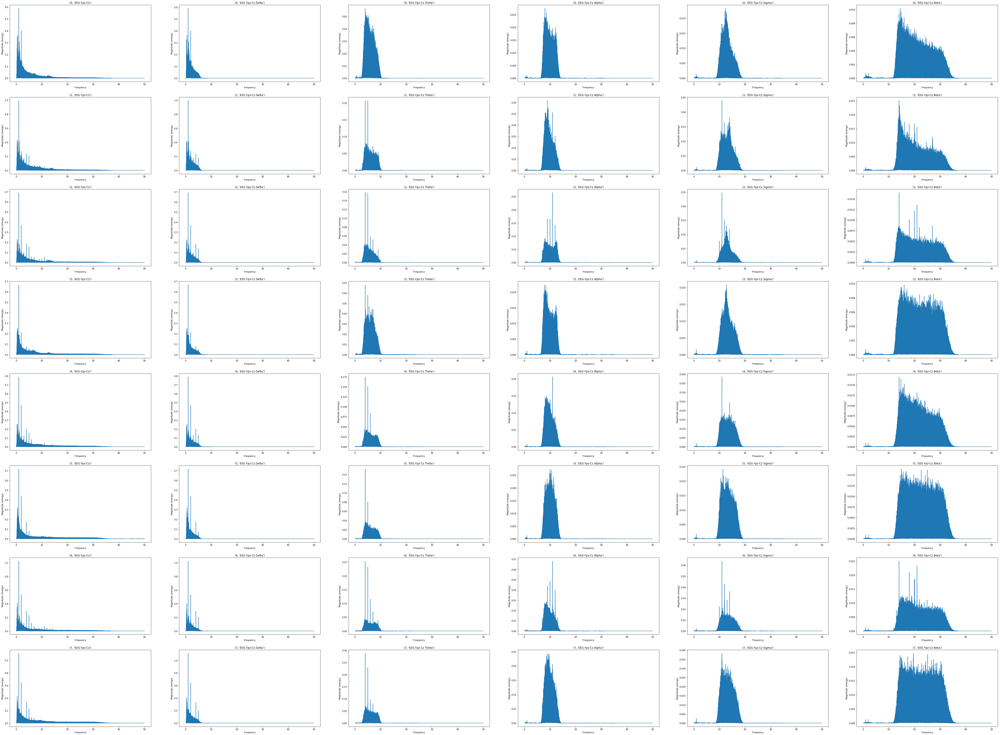

In [20]:
fig, axes = plt.subplots(nrows=8, ncols=6, figsize=(80, 60))

for df, n in zip(ep_df_, range(len(ep_df_))):
    clist = list(df.columns)
    for c in clist:
        axes[n, clist.index(c)].set_title((n, c))
        axes[n, clist.index(c)].magnitude_spectrum(np.array(df[c]), Fs=sfreq)

plt.savefig('Magnitude Spectrum.png')

In [21]:
ep_df_[0].to_csv('test.csv')

# Features calculation

In [22]:
# multi processing
def applyParallel(dfGrouped, func):
    retLst = Parallel(n_jobs=mp.cpu_count())(delayed(func)(group)
                                             for name, group in dfGrouped)
    return pd.concat(retLst, axis=1).T

"""Functions format.

1. MNE - features : univariate

    temps.append(
        applyParallel(
            grouped,
            lambda x: pd.Series(univariate.compute_XXX(x.T.values))).set_index(midx))

2. NUMPY

    temps.append(grouped.XXX(PPP))

3. STATS

    temps.append(
    applyParallel(
        grouped,
        lambda x: x.apply(stats.XXX,PPP,axis=0)).set_index(midx))

4. Entropy
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(XXX,PPP,axis=0)).set_index(midx))

5. USER DEF

    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(XXX,PPP,,axis=0)).set_index(midx))
"""

In [25]:
def Features_Calculate(df, f=None, b=None):
    grouped = df.groupby(level=['epoch', 'condition'])
    temps = []
    midx = []

    # multiIndex
    for idx, gr in grouped:
        midx.append(idx)
    midx = pd.MultiIndex.from_tuples(midx, names=('epoch', 'condition'))
    """---------------------------------------------------------------------------------------------------------------------------"""
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(Mean_frequency, axis=0)).set_index(midx))
    
    temps.append(
        applyParallel(
            grouped, lambda x: pd.Series(
                univariate.compute_hjorth_mobility(x.T.values))).set_index(midx))

    # Power
    temps.append(
        applyParallel(
            grouped,
            lambda x: x.apply(Power, sfreq=sfreq, axis=0)).set_index(midx))

    # STD
    temps.append(grouped.std())

    # SpectEn
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(spectral_entropy,
                                       sf=sfreq,
                                       method='welch',
                                       normalize=False,
                                       axis=0)).set_index(midx))

    # PermEn
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(perm_entropy, order=3, delay=1, axis=0)
        ).set_index(midx))

    # SVD_En
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(
                svd_entropy, order=3, delay=1, normalize=False, axis=0)).
        set_index(midx))

    # SampEn
    temps.append(
        applyParallel(
            grouped,
            lambda x: x.apply(sample_entropy, order=2, axis=0)).set_index(
                midx))

    # USER DEF
    temps.append(
        applyParallel(
            grouped, lambda x: x.apply(AutoCorr, k=1, axis=0)).set_index(midx))
    """---------------------------------------------------------------------------------------------------------------------------"""

    temps.append(
        applyParallel(grouped,
                      lambda x: x.apply(ThresholdVol, thr=75, axis=0))[[
                          six_bands_n[i] for i in b[0]
                      ]].set_index(midx))
    """---------------------------------------------------------------------------------------------------------------------------"""

    res = pd.concat(temps, axis=1)

    if (f == b == None):
        cols = [(i, j) for i in funcs_n[:f] for j in six_bands_n]
    else:
        cols = [(i, j) for i in funcs_n[:f] for j in six_bands_n] + [
            (i, j) for i in funcs_n[f:]
            for j in [six_bands_n[k] for k in b[list.index(funcs_n, i) - f]]
        ]
    res.columns = pd.MultiIndex.from_tuples(tuples=cols,
                                            names=['Function', 'Band'])

    return res

In [26]:
temp = []

st = time.time()
for df in ep_df_:
    temp.append(
        Features_Calculate(df, f=partial_bands_func_idx, b=partial_bands))
tr_df = pd.concat(temp, axis=0)

et = time.time()
print('time-consuming: %f' % (et - st))

time-consuming: 354.567909


In [27]:
tr_df = pd.concat(temp, axis=0)
tr_df.head()

Function            Mean_frequency                                    \
Band                    EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta   
epoch condition                                                        
2750  Sleep stage W       1.664953         1.272789         5.157914   
2751  Sleep stage W       2.557418         1.775817         4.964304   
2752  Sleep stage W       2.241108         1.716855         5.043503   
2753  Sleep stage W       2.232030         1.355480         5.412811   
2754  Sleep stage W       2.296112         1.667506         5.321712   

Function                                                               \
Band                EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma EEG Fpz-Cz Beta   
epoch condition                                                         
2750  Sleep stage W         9.697337        13.037134       22.958127   
2751  Sleep stage W         9.821403        13.130978       22.750405   
2752  Sleep stage W         9.556272        12.923802       22.410906   
2753  Sleep stage W         9.615211        13.262419       23.225215   
2754  Sleep stage W         9.237686        13.734931       22.261370   

Function            Hjorth_mobility                                    \
Band                     EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta   
epoch condition                                                         
2750  Sleep stage W        0.210770         0.108411         0.333452   
2751  Sleep stage W        0.265567         0.135344         0.323986   
2752  Sleep stage W        0.225223         0.130442         0.321501   
2753  Sleep stage W        0.265103         0.115991         0.344513   
2754  Sleep stage W        0.245674         0.143645         0.344098   

Function                                   ...                  SampEn  \
Band                EEG Fpz-Cz Alpha       ...        EEG Fpz-Cz Alpha   
epoch condition                            ...                           
2750  Sleep stage W         0.600818       ...                0.622485   
2751  Sleep stage W         0.609243       ...                0.628287   
2752  Sleep stage W         0.597755       ...                0.616738   
2753  Sleep stage W         0.599916       ...                0.611738   
2754  Sleep stage W         0.582714       ...                0.617204   

Function                                               AutoCorr  \
Band                EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz   
epoch condition                                                   
2750  Sleep stage W         0.755880        1.617767   0.977667   
2751  Sleep stage W         0.740053        1.534523   0.965642   
2752  Sleep stage W         0.725153        1.486089   0.974621   
2753  Sleep stage W         0.698729        1.196411   0.963653   
2754  Sleep stage W         0.752756        1.635461   0.973309   

Function                                                                \
Band                EEG Fpz-Cz Delta EEG Fpz-Cz Theta EEG Fpz-Cz Alpha   
epoch condition                                                          
2750  Sleep stage W         0.994010         0.943813         0.819424   
2751  Sleep stage W         0.991236         0.948917         0.814643   
2752  Sleep stage W         0.991409         0.947258         0.821590   
2753  Sleep stage W         0.991792         0.941834         0.819554   
2754  Sleep stage W         0.993970         0.942251         0.831757   

Function                                                        Thr75  
Band                EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz Delta  
epoch condition                                                        
2750  Sleep stage W         0.669260        0.124444               23  
2751  Sleep stage W         0.666057        0.132910                1  
2752  Sleep stage W         0.679827        0.159802                1  
2753  Sleep stage W         0.663158        0.106962                1  
2754  Sleep stage W       

# Preprocessing

### Missing value dection

In [28]:
tr_df.describe().to_csv('des_0.csv')
tr_df.describe()

Function Mean_frequency                                                     \
Band         EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta EEG Fpz-Cz Alpha   
count      22242.000000     22242.000000     22242.000000     22242.000000   
mean           3.438913         1.494005         5.840268         9.696116   
std            2.357236         0.421669         0.628164         0.466135   
min            0.503860         0.409534         4.488445         7.812555   
25%            1.845350         1.182392         5.383178         9.403003   
50%            2.778780         1.457934         5.710900         9.692419   
75%            4.155882         1.770734         6.165032         9.985123   
max           18.763078         3.322755         8.317155        11.833860   

Function                                  Hjorth_mobility                   \
Band     EEG Fpz-Cz Sigma EEG Fpz-Cz Beta      EEG Fpz-Cz EEG Fpz-Cz Delta   
count        22242.000000    22242.000000    22242.000000     22242.000000   
mean            13.046022       20.596907        0.329373         0.122106   
std              0.486806        1.971186        0.173170         0.027107   
min             11.044345       15.211463        0.050370         0.041031   
25%             12.710822       19.061411        0.205494         0.102112   
50%             13.049288       20.742704        0.287967         0.120816   
75%             13.389384       22.166097        0.400406         0.140966   
max             14.886093       26.862862        1.126451         0.233315   

Function                                         ...                  SampEn  \
Band     EEG Fpz-Cz Theta EEG Fpz-Cz Alpha       ...        EEG Fpz-Cz Alpha   
count        22242.000000     22242.000000       ...            22242.000000   
mean             0.377792         0.606094       ...                0.605835   
std              0.037749         0.027557       ...                0.035369   
min              0.298147         0.489714       ...                0.111053   
25%              0.350431         0.589078       ...                0.587579   
50%              0.370306         0.606422       ...                0.609001   
75%              0.397584         0.623089       ...                0.627626   
max              0.518735         0.720693       ...                0.738411   

Function                                       AutoCorr                   \
Band     EEG Fpz-Cz Sigma EEG Fpz-Cz Beta    EEG Fpz-Cz EEG Fpz-Cz Delta   
count        22242.000000    22242.000000  22242.000000     22242.000000   
mean             0.681038        1.522441      0.931278         0.992700   
std              0.097235        0.172021      0.080866         0.003731   
min              0.101745        0.090224      0.365749         0.935077   
25%              0.615580        1.449569      0.920172         0.990476   
50%              0.693246        1.555192      0.959073         0.993209   
75%              0.751819        1.635123      0.979357         0.995304   
max              1.040972        1.869123      1.003181         1.017139   

Function                                                                     \
Band     EEG Fpz-Cz Theta EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma EEG Fpz-Cz Beta   
count        22242.000000     22242.000000     22242.000000    22242.000000   
mean             0.928446         0.816471         0.677700        0.261431   
std              0.014989         0.016772         0.021917        0.114816   
min              0.864745         0.741115         0.599653       -0.108120   
25%              0.921503         0.806446         0.662197        0.168948   
50%              0.931890         0.816698         0.677551        0.253964   
75%              0.939149         0.827029         0.693165        0.353846   
max              0.970999         0.880498         0.759090        0.564694   

Function            Thr75  
Band     EEG Fpz-Cz Delta  
count        22242.000000  
m

In [29]:
# inf value processing
tr_df.replace([np.inf,-np.inf],np.nan,inplace = True)
# missing value processing
tr_df.dropna(inplace=True)

In [30]:
# Feature cross
lev1_comblist = list(
    combinations(list(tr_df.columns.get_level_values(1).unique()), r=2))
ls = list(tr_df.columns.get_level_values(0).unique())[:partial_bands_func_idx]

for fes in ls:
    cInd = int((ls.index(fes)+1)*len(six_bands_n)+ls.index(fes)*len(ratio_n))

    i = 0
    for rn, coms in zip(ratio_n, lev1_comblist):
        ncol = (fes,rn)
        nval = tr_df[(fes, coms[1])] / tr_df[(fes, coms[0])]
        tr_df.insert(loc=(cInd + i), column=ncol, value=nval)
        i = i + 1

In [31]:
tr_df.head()

Function            Mean_frequency                                    \
Band                    EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta   
epoch condition                                                        
2750  Sleep stage W       1.664953         1.272789         5.157914   
2751  Sleep stage W       2.557418         1.775817         4.964304   
2752  Sleep stage W       2.241108         1.716855         5.043503   
2753  Sleep stage W       2.232030         1.355480         5.412811   
2754  Sleep stage W       2.296112         1.667506         5.321712   

Function                                                               \
Band                EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma EEG Fpz-Cz Beta   
epoch condition                                                         
2750  Sleep stage W         9.697337        13.037134       22.958127   
2751  Sleep stage W         9.821403        13.130978       22.750405   
2752  Sleep stage W         9.556272        12.923802       22.410906   
2753  Sleep stage W         9.615211        13.262419       23.225215   
2754  Sleep stage W         9.237686        13.734931       22.261370   

Function                                                          \
Band                EEG Fpz-Cz DOR EEG Fpz-Cz TOR EEG Fpz-Cz AOR   
epoch condition                                                    
2750  Sleep stage W       0.764460       3.097934       5.824392   
2751  Sleep stage W       0.694379       1.941139       3.840358   
2752  Sleep stage W       0.766074       2.250451       4.264084   
2753  Sleep stage W       0.607286       2.425062       4.307833   
2754  Sleep stage W       0.726230       2.317706       4.023185   

Function                                 ...              AutoCorr  \
Band                EEG Fpz-Cz SOR       ...        EEG Fpz-Cz ADR   
epoch condition                          ...                         
2750  Sleep stage W       7.830333       ...              0.824361   
2751  Sleep stage W       5.134466       ...              0.821846   
2752  Sleep stage W       5.766702       ...              0.828709   
2753  Sleep stage W       5.941865       ...              0.826336   
2754  Sleep stage W       5.981820       ...              0.836802   

Function                                                          \
Band                EEG Fpz-Cz SDR EEG Fpz-Cz BDR EEG Fpz-Cz ATR   
epoch condition                                                    
2750  Sleep stage W       0.673293       0.125194       0.868205   
2751  Sleep stage W       0.671946       0.134085       0.858498   
2752  Sleep stage W       0.685718       0.161187       0.867335   
2753  Sleep stage W       0.668646       0.107848       0.870169   
2754  Sleep stage W       0.649547       0.164805       0.882734   

Function                                                          \
Band                EEG Fpz-Cz STR EEG Fpz-Cz BTR EEG Fpz-Cz SAR   
epoch condition                                                    
2750  Sleep stage W       0.709102       0.131853       0.816745   
2751  Sleep stage W       0.701913       0.140065       0.817606   
2752  Sleep stage W       0.717679       0.168700       0.827453   
2753  Sleep stage W       0.704113       0.113568       0.809169   
2754  Sleep stage W       0.685200       0.173851       0.776225   

Function                                                     Thr75  
Band                EEG Fpz-Cz BAR EEG Fpz-Cz BSR EEG Fpz-Cz Delta  
epoch condition                                                     
2750  Sleep stage W       0.151868       0.185943               23  
2751  Sleep stage W       0.163151       0.199548                1  
2752  Sleep stage W       0.194504       0.235063                1  
2753  Sleep stage W       0.130513       0.161293                1  
2754  Sleep stage W       0.196946       0.253723                6  

[5 rows x 190 columns]

In [32]:
tr_df.describe().to_csv('des_1.csv')
tr_df.describe()

Function Mean_frequency                                                     \
Band         EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta EEG Fpz-Cz Alpha   
count      22242.000000     22242.000000     22242.000000     22242.000000   
mean           3.438913         1.494005         5.840268         9.696116   
std            2.357236         0.421669         0.628164         0.466135   
min            0.503860         0.409534         4.488445         7.812555   
25%            1.845350         1.182392         5.383178         9.403003   
50%            2.778780         1.457934         5.710900         9.692419   
75%            4.155882         1.770734         6.165032         9.985123   
max           18.763078         3.322755         8.317155        11.833860   

Function                                                                 \
Band     EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz DOR EEG Fpz-Cz TOR   
count        22242.000000    22242.000000   22242.000000   22242.000000   
mean            13.046022       20.596907       0.548863       2.338421   
std              0.486806        1.971186       0.206543       1.252853   
min             11.044345       15.211463       0.083361       0.333583   
25%             12.710822       19.061411       0.389697       1.426861   
50%             13.049288       20.742704       0.566618       2.063768   
75%             13.389384       22.166097       0.711698       3.049897   
max             14.886093       26.862862       1.062068      13.109798   

Function                                     ...              AutoCorr  \
Band     EEG Fpz-Cz AOR EEG Fpz-Cz SOR       ...        EEG Fpz-Cz ADR   
count      22242.000000   22242.000000       ...          22242.000000   
mean           3.979713       5.303990       ...              0.822488   
std            2.242203       2.900608       ...              0.017274   
min            0.531484       0.742933       ...              0.744939   
25%            2.312625       3.161686       ...              0.811985   
50%            3.503472       4.698565       ...              0.822461   
75%            5.275943       6.970647       ...              0.833139   
max           19.313247      25.894667       ...              0.886527   

Function                                                              \
Band     EEG Fpz-Cz SDR EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR   
count      22242.000000   22242.000000   22242.000000   22242.000000   
mean           0.682676       0.263352       0.879766       0.730083   
std            0.021694       0.115671       0.028024       0.025407   
min            0.601257      -0.109060       0.783633       0.646587   
25%            0.667201       0.170216       0.862144       0.712576   
50%            0.682820       0.255842       0.876027       0.729487   
75%            0.698163       0.355988       0.893948       0.746007   
max            0.766947       0.570302       0.986923       0.855083   

Function                                                              \
Band     EEG Fpz-Cz BTR EEG Fpz-Cz SAR EEG Fpz-Cz BAR EEG Fpz-Cz BSR   
count      22242.000000   22242.000000   22242.000000   22242.000000   
mean           0.281494       0.830489       0.320768       0.384093   
std            0.122961       0.034509       0.142899       0.166245   
min           -0.114165       0.701753      -0.131337      -0.166125   
25%            0.182042       0.806190       0.205938       0.251053   
50%            0.275364       0.826717       0.308437       0.372900   
75%            0.381805       0.853005       0.433226       0.515443   
max            0.610916       0.947497       0.725419       0.862202   

Function            Thr75  
Band     EEG Fpz-Cz Delta  
count        22242.000000  
mean             4.673905  
std             12.212192  
min              1.000000  
25%              1.000000  
50%              1.000000  
75%              1.000000  
max            236.000000  

[8 r

In [33]:
# inf value processing
tr_df.replace([np.inf,-np.inf],np.nan,inplace = True)
# missing value processing
tr_df.dropna(inplace=True)

In [34]:
tr_df.describe().to_csv('des_2.csv')
tr_df.describe()

Function Mean_frequency                                                     \
Band         EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta EEG Fpz-Cz Alpha   
count      22242.000000     22242.000000     22242.000000     22242.000000   
mean           3.438913         1.494005         5.840268         9.696116   
std            2.357236         0.421669         0.628164         0.466135   
min            0.503860         0.409534         4.488445         7.812555   
25%            1.845350         1.182392         5.383178         9.403003   
50%            2.778780         1.457934         5.710900         9.692419   
75%            4.155882         1.770734         6.165032         9.985123   
max           18.763078         3.322755         8.317155        11.833860   

Function                                                                 \
Band     EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz DOR EEG Fpz-Cz TOR   
count        22242.000000    22242.000000   22242.000000   22242.000000   
mean            13.046022       20.596907       0.548863       2.338421   
std              0.486806        1.971186       0.206543       1.252853   
min             11.044345       15.211463       0.083361       0.333583   
25%             12.710822       19.061411       0.389697       1.426861   
50%             13.049288       20.742704       0.566618       2.063768   
75%             13.389384       22.166097       0.711698       3.049897   
max             14.886093       26.862862       1.062068      13.109798   

Function                                     ...              AutoCorr  \
Band     EEG Fpz-Cz AOR EEG Fpz-Cz SOR       ...        EEG Fpz-Cz ADR   
count      22242.000000   22242.000000       ...          22242.000000   
mean           3.979713       5.303990       ...              0.822488   
std            2.242203       2.900608       ...              0.017274   
min            0.531484       0.742933       ...              0.744939   
25%            2.312625       3.161686       ...              0.811985   
50%            3.503472       4.698565       ...              0.822461   
75%            5.275943       6.970647       ...              0.833139   
max           19.313247      25.894667       ...              0.886527   

Function                                                              \
Band     EEG Fpz-Cz SDR EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR   
count      22242.000000   22242.000000   22242.000000   22242.000000   
mean           0.682676       0.263352       0.879766       0.730083   
std            0.021694       0.115671       0.028024       0.025407   
min            0.601257      -0.109060       0.783633       0.646587   
25%            0.667201       0.170216       0.862144       0.712576   
50%            0.682820       0.255842       0.876027       0.729487   
75%            0.698163       0.355988       0.893948       0.746007   
max            0.766947       0.570302       0.986923       0.855083   

Function                                                              \
Band     EEG Fpz-Cz BTR EEG Fpz-Cz SAR EEG Fpz-Cz BAR EEG Fpz-Cz BSR   
count      22242.000000   22242.000000   22242.000000   22242.000000   
mean           0.281494       0.830489       0.320768       0.384093   
std            0.122961       0.034509       0.142899       0.166245   
min           -0.114165       0.701753      -0.131337      -0.166125   
25%            0.182042       0.806190       0.205938       0.251053   
50%            0.275364       0.826717       0.308437       0.372900   
75%            0.381805       0.853005       0.433226       0.515443   
max            0.610916       0.947497       0.725419       0.862202   

Function            Thr75  
Band     EEG Fpz-Cz Delta  
count        22242.000000  
mean             4.673905  
std             12.212192  
min              1.000000  
25%              1.000000  
50%              1.000000  
75%              1.000000  
max            236.000000  

[8 r

In [35]:
tr_df = tr_df.reset_index(level='condition')
train_X = tr_df.drop(columns=['condition'])
train_Y = tr_df['condition']

C:\Users\vita7\Anaconda3\lib\site-packages\pandas\core\generic.py:3111: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


In [36]:
train_X.head()

Function Mean_frequency                                                     \
Band         EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta EEG Fpz-Cz Alpha   
epoch                                                                        
2750           1.664953         1.272789         5.157914         9.697337   
2751           2.557418         1.775817         4.964304         9.821403   
2752           2.241108         1.716855         5.043503         9.556272   
2753           2.232030         1.355480         5.412811         9.615211   
2754           2.296112         1.667506         5.321712         9.237686   

Function                                                                 \
Band     EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz DOR EEG Fpz-Cz TOR   
epoch                                                                     
2750            13.037134       22.958127       0.764460       3.097934   
2751            13.130978       22.750405       0.694379       1.941139   
2752            12.923802       22.410906       0.766074       2.250451   
2753            13.262419       23.225215       0.607286       2.425062   
2754            13.734931       22.261370       0.726230       2.317706   

Function                                     ...              AutoCorr  \
Band     EEG Fpz-Cz AOR EEG Fpz-Cz SOR       ...        EEG Fpz-Cz ADR   
epoch                                        ...                         
2750           5.824392       7.830333       ...              0.824361   
2751           3.840358       5.134466       ...              0.821846   
2752           4.264084       5.766702       ...              0.828709   
2753           4.307833       5.941865       ...              0.826336   
2754           4.023185       5.981820       ...              0.836802   

Function                                                              \
Band     EEG Fpz-Cz SDR EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR   
epoch                                                                  
2750           0.673293       0.125194       0.868205       0.709102   
2751           0.671946       0.134085       0.858498       0.701913   
2752           0.685718       0.161187       0.867335       0.717679   
2753           0.668646       0.107848       0.870169       0.704113   
2754           0.649547       0.164805       0.882734       0.685200   

Function                                                              \
Band     EEG Fpz-Cz BTR EEG Fpz-Cz SAR EEG Fpz-Cz BAR EEG Fpz-Cz BSR   
epoch                                                                  
2750           0.131853       0.816745       0.151868       0.185943   
2751           0.140065       0.817606       0.163151       0.199548   
2752           0.168700       0.827453       0.194504       0.235063   
2753           0.113568       0.809169       0.130513       0.161293   
2754           0.173851       0.776225       0.196946       0.253723   

Function            Thr75  
Band     EEG Fpz-Cz Delta  
epoch                      
2750                   23  
2751                    1  
2752                    1  
2753                    1  
2754                    6  

[5 rows x 190 columns]

In [37]:
tr_df.head()

Function      condition Mean_frequency                                    \
Band                        EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta   
epoch                                                                      
2750      Sleep stage W       1.664953         1.272789         5.157914   
2751      Sleep stage W       2.557418         1.775817         4.964304   
2752      Sleep stage W       2.241108         1.716855         5.043503   
2753      Sleep stage W       2.232030         1.355480         5.412811   
2754      Sleep stage W       2.296112         1.667506         5.321712   

Function                                                                   \
Band     EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz DOR   
epoch                                                                       
2750             9.697337        13.037134       22.958127       0.764460   
2751             9.821403        13.130978       22.750405       0.694379   
2752             9.556272        12.923802       22.410906       0.766074   
2753             9.615211        13.262419       23.225215       0.607286   
2754             9.237686        13.734931       22.261370       0.726230   

Function                                     ...              AutoCorr  \
Band     EEG Fpz-Cz TOR EEG Fpz-Cz AOR       ...        EEG Fpz-Cz ADR   
epoch                                        ...                         
2750           3.097934       5.824392       ...              0.824361   
2751           1.941139       3.840358       ...              0.821846   
2752           2.250451       4.264084       ...              0.828709   
2753           2.425062       4.307833       ...              0.826336   
2754           2.317706       4.023185       ...              0.836802   

Function                                                              \
Band     EEG Fpz-Cz SDR EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR   
epoch                                                                  
2750           0.673293       0.125194       0.868205       0.709102   
2751           0.671946       0.134085       0.858498       0.701913   
2752           0.685718       0.161187       0.867335       0.717679   
2753           0.668646       0.107848       0.870169       0.704113   
2754           0.649547       0.164805       0.882734       0.685200   

Function                                                              \
Band     EEG Fpz-Cz BTR EEG Fpz-Cz SAR EEG Fpz-Cz BAR EEG Fpz-Cz BSR   
epoch                                                                  
2750           0.131853       0.816745       0.151868       0.185943   
2751           0.140065       0.817606       0.163151       0.199548   
2752           0.168700       0.827453       0.194504       0.235063   
2753           0.113568       0.809169       0.130513       0.161293   
2754           0.173851       0.776225       0.196946       0.253723   

Function            Thr75  
Band     EEG Fpz-Cz Delta  
epoch                      
2750                   23  
2751                    1  
2752                    1  
2753                    1  
2754                    6  

[5 rows x 191 columns]

In [38]:
df = tr_df.copy()
df.columns = list(tr_df.columns)
df.to_csv('tr_df.csv')

### Collinarity diagnosis

In [58]:
def Collinarity_dia(df, lev=0):

    vif_ = []
    for n in list(train_X.columns.get_level_values(abs(lev-1)).unique()):
        temp = df.xs(n, level=abs(lev-1), axis=1)
        temp = add_constant(temp)
        vif = list(
            variance_inflation_factor(temp.values, i)
            for i in range(temp.shape[1]))[1:]
        vif_.append(vif)

    result = pd.DataFrame(vif_)
    result.index = list(train_X.columns.get_level_values(abs(lev-1)).unique())
    
    if lev == 0:
        result.columns = funcs_n
    else:
        result.columns = frbands_n
    return result

In [60]:
vif_ = Collinarity_dia(tr_df,lev=0)
vif_.to_csv('Collinarity_dia_0.csv')
vif_

,Mean_frequency,Hjorth_mobility,Power,STD,SpectEn,PermEn,SVD_En,SampEn,AutoCorr,Thr75
EEG Fpz-Cz,34.331199,519.612223,7.059529,8.619629,13.854859,4.789469,168.951621,16.965016,137.203155,NaN
EEG Fpz-Cz Delta,10.118728,14.446035,12.519460,10.024894,7.791187,2.542064,35.124471,2.270465,5.993908,3.449855
EEG Fpz-Cz Theta,18.986938,71.639372,9.115651,9.377293,2.905118,4.909235,47.986726,1.455747,47.136139,NaN
EEG Fpz-Cz Alpha,12.161476,84.048910,5.822184,6.320491,4.181377,4.473471,12.682866,1.621531,80.540750,NaN
EEG Fpz-Cz Sigma,10.919206,159.152425,3.229326,3.446635,5.466541,4.401138,11.249172,3.593284,156.418638,NaN
EEG Fpz-Cz Beta,37.902451,1109.355242,2.807485,4.105256,8.437005,9.852649,4.912339,1.486045,1156.833831,NaN
EEG Fpz-Cz DOR,41.717555,28.545995,34.346017,28.599344,18.483626,4.029791,24.999197,5.240069,3.384911,NaN
EEG Fpz-Cz TOR,27.173725,118.391253,12.161248,18.239085,17.305586,3.904961,137.225791,15.561061,1.646086,NaN
EEG Fpz-Cz AOR,25.243494,140.255263,12.425899,20.553547,13.507870,5.408383,181.578001,14.151725,1.722820,NaN
EEG Fpz-Cz SOR,22.676183,125.225821,12.140736,19.828111,10.093973,4.360341,151.731194,10.817737,2.127834,NaN


In [61]:
vif_ = Collinarity_dia(tr_df,lev=1)
vif_.to_csv('Collinarity_dia_1.csv')
vif_

,EEG Fpz-Cz,EEG Fpz-Cz Delta,EEG Fpz-Cz Theta,EEG Fpz-Cz Alpha,EEG Fpz-Cz Sigma,EEG Fpz-Cz Beta,EEG Fpz-Cz DOR,EEG Fpz-Cz TOR,EEG Fpz-Cz AOR,EEG Fpz-Cz SOR,...,EEG Fpz-Cz TDR,EEG Fpz-Cz ADR,EEG Fpz-Cz SDR,EEG Fpz-Cz BDR,EEG Fpz-Cz ATR,EEG Fpz-Cz STR,EEG Fpz-Cz BTR,EEG Fpz-Cz SAR,EEG Fpz-Cz BAR,EEG Fpz-Cz BSR
Mean_frequency,8.130704,9.424241,167.261656,711.013954,1169.975152,4691.460829,40.797071,376.839234,1526.727373,2210.803824,...,360.727223,1226.460904,1775.718084,754.991678,1356.018352,1418.353936,848.483569,924.080632,1326.387055,1077.343945
Hjorth_mobility,13.292728,12.672005,159.388470,846.589626,1693.105103,6446.902024,55.808743,396.389509,1414.273782,2552.470674,...,314.205705,963.374868,1727.961582,789.912798,1591.245254,1751.132298,1130.347087,1308.845395,1890.165945,1489.595425
Power,388.995395,378.188182,4.020377,10.712712,20.001625,14.781142,33.377080,18.653745,37.375290,45.304256,...,28.202019,37.464069,54.775232,32.585488,13.237695,23.325418,23.820850,7.432238,19.697045,9.286275
STD,1070.147024,1079.748353,19.062974,47.215401,55.060798,39.657877,87.996026,186.897565,329.685852,527.837045,...,272.031161,337.475280,616.225955,357.369390,60.800346,104.763679,94.698984,33.493299,79.762991,34.895860
SpectEn,101.358929,53.423537,175.896819,309.549401,947.762266,803.914215,241.521095,1433.764613,1084.871208,1687.006985,...,1462.467389,892.567278,1929.596437,2722.333461,323.735575,883.798687,983.499382,531.630607,555.527927,75.681341
PermEn,372.835258,691.614368,2112.124381,7211.734408,18798.972322,30094.626432,1766.632264,2626.742750,5979.196936,9671.154643,...,2723.141545,5529.924773,7611.006960,7544.548271,10166.076272,8955.512277,9855.515495,15330.220573,17998.427873,8321.943646
SVD_En,53.403284,40.201670,1121.856649,5128.009788,24748.028189,19251.330356,155.909391,2980.505147,6488.394888,11794.018791,...,2319.252754,4065.969734,8114.352614,10438.644810,8512.369603,6917.493569,13198.609234,17437.387659,14538.180254,4642.585261
SampEn,10.964648,12.608965,76.075737,130.174726,683.711578,183.933788,34.584499,303.047772,328.228240,124.072718,...,291.798257,333.747264,224.765204,118.275249,179.987855,588.755800,313.987140,307.538624,216.881623,43.291997
AutoCorr,53.644369,6796.702953,63870.410280,72799.392183,150022.054732,155449.373767,28939.920270,10184.030241,9103.273241,2367.761878,...,66440.365455,69018.668261,124072.469747,112361.966744,5350.037927,6163.345922,10908.171623,3224.315644,6157.842540,1979.633295
Thr75,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Model fitting

### Normalization and Encoding

In [41]:
# Label Encoder
le = preprocessing.LabelEncoder()
# scaler
mmscaler = MinMaxScaler(feature_range=(0, 1))
stscaler = StandardScaler()

### Fitting

In [76]:
# All of the features

trX = stscaler.fit_transform(train_X)
trY = le.fit_transform(train_Y)

#estimator = LinearDiscriminantAnalysis()
#estimator = tree.DecisionTreeClassifier(criterion='gini',max_depth=7)
#estimator = SVC()
estimator = LogisticRegression(penalty='l2')
cv = cross_val_score(estimator, trX, trY, cv=5).mean()

with open("REPORT.csv", "a+") as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['OverallAcc',cv])

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver wi

In [66]:
# Level_0 ACC
cv_ = []

for i in list(train_X.columns.get_level_values(0).unique()):
    trX = stscaler.fit_transform(train_X.xs(i,level = 0,axis=1))
    cv_.append(cross_val_score(estimator, trX, trY, cv=5).mean())

with open("REPORT.csv", "a+") as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Level_0_Acc']+cv_)

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [44]:
# Level_1 ACC
cv_=[]

for i in list(train_X.columns.get_level_values(1).unique()):
    trX = stscaler.fit_transform(train_X.xs(i,level = 1,axis=1))
    cv_.append(cross_val_score(estimator, trX, trY, cv=5).mean())

with open("REPORT.csv", "a+") as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Level_1_Acc']+cv_)

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default so

In [45]:
# Level_2 ACC
cv_=[]

for i in list(train_X.columns):
    trX = stscaler.fit_transform(train_X[[i]])
    cv_.append(cross_val_score(estimator, trX, trY, cv=5).mean())

with open("REPORT.csv", "a+") as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Level_2_Acc']+cv_)

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default so

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default mu

C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:625: DataConversionWarning: Data with input dtype int64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\vita7\Anaconda3\lib\site-packages\sklearn\base.py:462: DataConversionWarning: Data with input

# Visualization

In [46]:
df = tr_df.copy(deep=True)
df.head()

Function      condition Mean_frequency                                    \
Band                        EEG Fpz-Cz EEG Fpz-Cz Delta EEG Fpz-Cz Theta   
epoch                                                                      
2750      Sleep stage W       1.664953         1.272789         5.157914   
2751      Sleep stage W       2.557418         1.775817         4.964304   
2752      Sleep stage W       2.241108         1.716855         5.043503   
2753      Sleep stage W       2.232030         1.355480         5.412811   
2754      Sleep stage W       2.296112         1.667506         5.321712   

Function                                                                   \
Band     EEG Fpz-Cz Alpha EEG Fpz-Cz Sigma EEG Fpz-Cz Beta EEG Fpz-Cz DOR   
epoch                                                                       
2750             9.697337        13.037134       22.958127       0.764460   
2751             9.821403        13.130978       22.750405       0.694379   
2752             9.556272        12.923802       22.410906       0.766074   
2753             9.615211        13.262419       23.225215       0.607286   
2754             9.237686        13.734931       22.261370       0.726230   

Function                                     ...              AutoCorr  \
Band     EEG Fpz-Cz TOR EEG Fpz-Cz AOR       ...        EEG Fpz-Cz ADR   
epoch                                        ...                         
2750           3.097934       5.824392       ...              0.824361   
2751           1.941139       3.840358       ...              0.821846   
2752           2.250451       4.264084       ...              0.828709   
2753           2.425062       4.307833       ...              0.826336   
2754           2.317706       4.023185       ...              0.836802   

Function                                                              \
Band     EEG Fpz-Cz SDR EEG Fpz-Cz BDR EEG Fpz-Cz ATR EEG Fpz-Cz STR   
epoch                                                                  
2750           0.673293       0.125194       0.868205       0.709102   
2751           0.671946       0.134085       0.858498       0.701913   
2752           0.685718       0.161187       0.867335       0.717679   
2753           0.668646       0.107848       0.870169       0.704113   
2754           0.649547       0.164805       0.882734       0.685200   

Function                                                              \
Band     EEG Fpz-Cz BTR EEG Fpz-Cz SAR EEG Fpz-Cz BAR EEG Fpz-Cz BSR   
epoch                                                                  
2750           0.131853       0.816745       0.151868       0.185943   
2751           0.140065       0.817606       0.163151       0.199548   
2752           0.168700       0.827453       0.194504       0.235063   
2753           0.113568       0.809169       0.130513       0.161293   
2754           0.173851       0.776225       0.196946       0.253723   

Function            Thr75  
Band     EEG Fpz-Cz Delta  
epoch                      
2750                   23  
2751                    1  
2752                    1  
2753                    1  
2754                    6  

[5 rows x 191 columns]

C:\Users\vita7\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


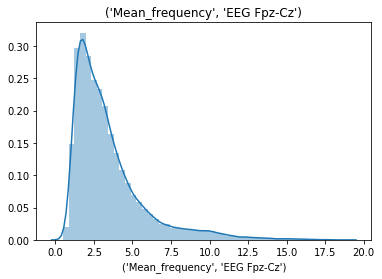

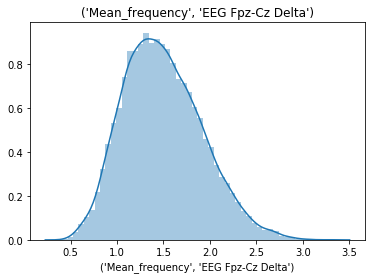

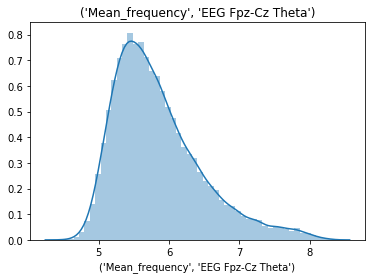

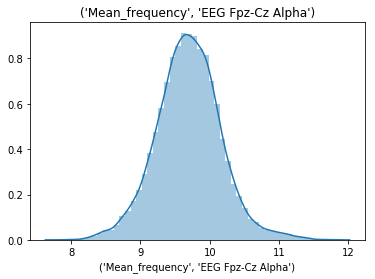

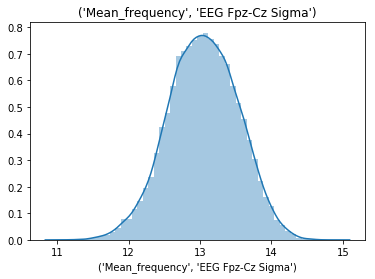

...

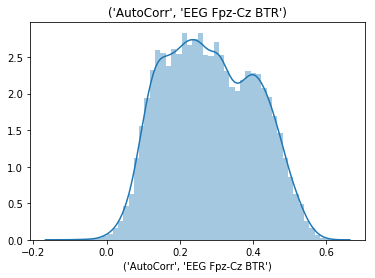

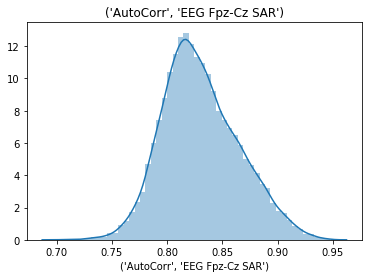

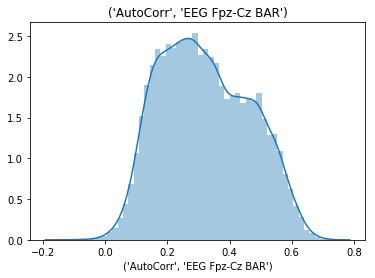

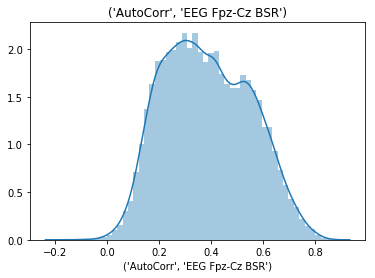

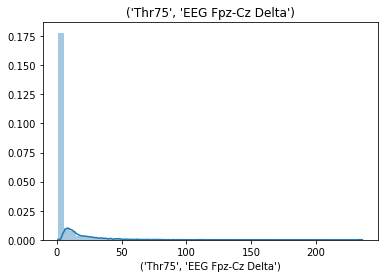

In [47]:
results_dir = 'C:/Users/vita7/OneDrive/Documents/Github/EEG_SleepStage_Analysis/KDE/'

if not os.path.isdir(results_dir): 
    os.makedirs(results_dir)

# Dist + KDE
for col in list(train_X.columns):
    sns.distplot(train_X[col])
    plt.title(col)
    plt.savefig(results_dir + str(col) + '_KDE.png')
    plt.show()

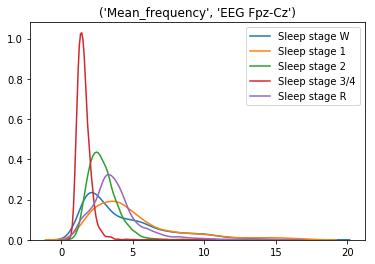

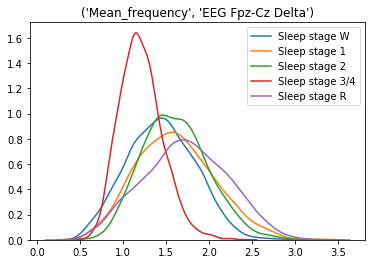

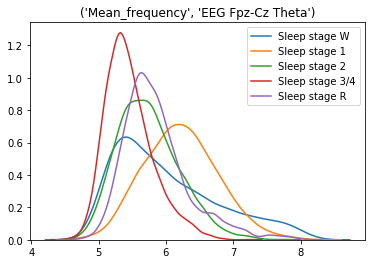

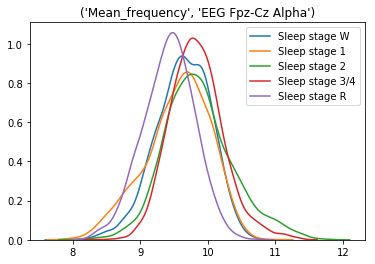

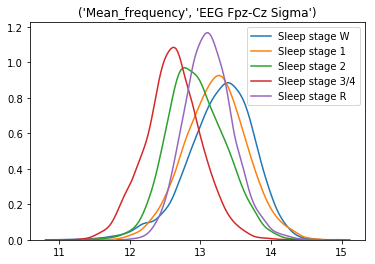

...

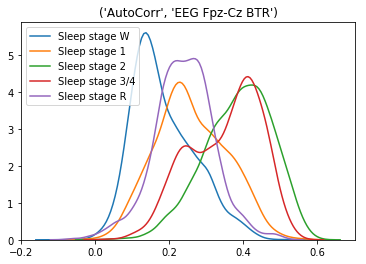

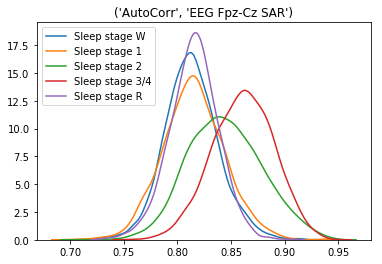

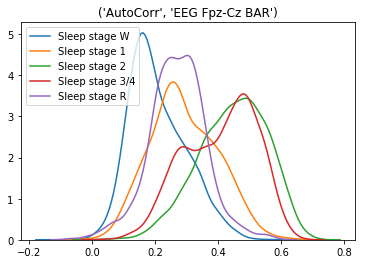

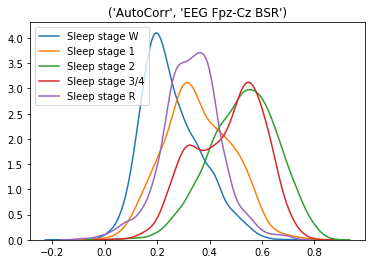

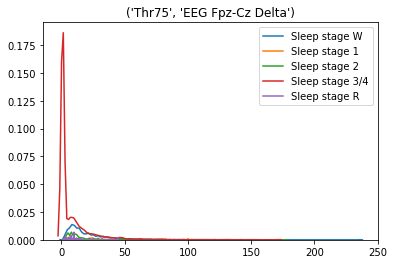

In [48]:
results_dir = 'C:/Users/vita7/OneDrive/Documents/Github/EEG_SleepStage_Analysis/Stage_KDE/'

if not os.path.isdir(results_dir): 
    os.makedirs(results_dir)

for col in list(train_X.columns):
    plt.title(col)
    for stage in list(event_id.keys()):
        sns.kdeplot(df[df['condition'] == stage][col], label=stage)
    plt.savefig(results_dir + str(col) + '_stage_KDE.png')
    plt.show()

### Correlation matrix

C:\Users\vita7\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


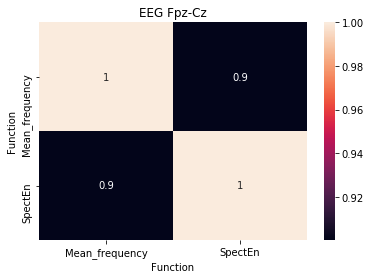

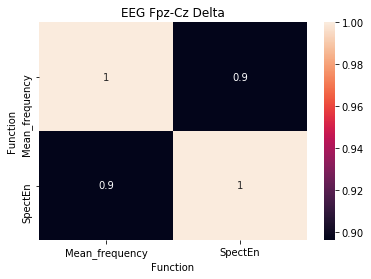

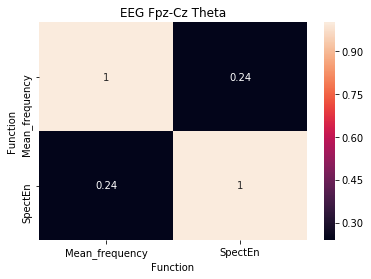

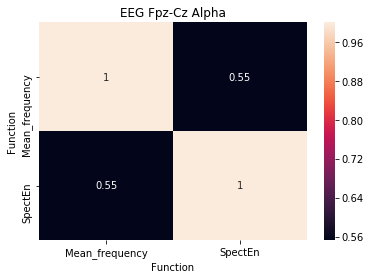

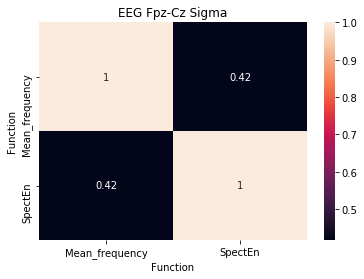

...

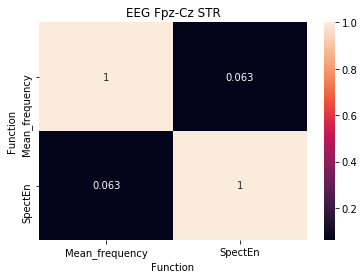

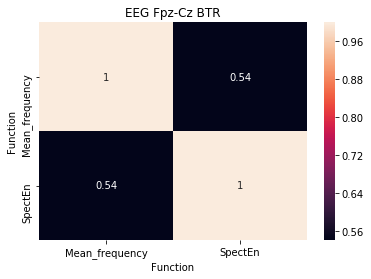

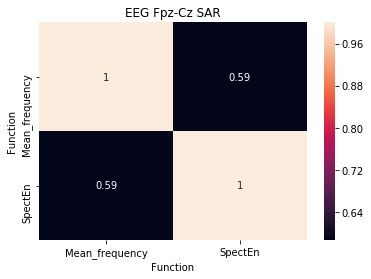

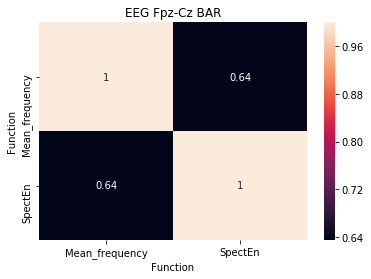

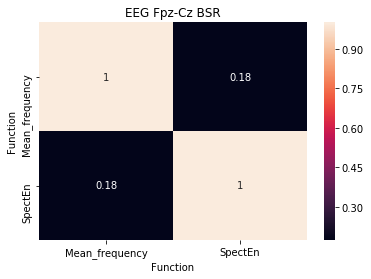

In [77]:
results_dir = 'C:/Users/vita7/OneDrive/Documents/Github/EEG_SleepStage_Analysis/Correlation matrix/'

if not os.path.isdir(results_dir): 
    os.makedirs(results_dir)
    
for col in tr_df.columns.get_level_values(1).unique()[1:]:
    df_corr = tr_df.xs(col,level=1,axis=1)[['Mean_frequency','SpectEn']].corr()
    plt.figure()
    plt.title(col)
    sns.heatmap(df_corr,annot=True)
    plt.savefig(results_dir + str(col) + '_Correlation matrix.png')
    